Votre mission est d’aider les équipes d’Olist à comprendre les différents types d'utilisateurs. Vous utiliserez donc des méthodes non supervisées pour regrouper ensemble des clients de profils similaires. Ces catégories pourront être utilisées par l’équipe marketing pour mieux communiquer.

Votre client, Olist, a spécifié sa demande ainsi :
* La segmentation proposée doit être exploitable et facile d’utilisation pour l’équipe marketing.
* Vous évaluerez la fréquence à laquelle la segmentation doit être mise à jour, afin de pouvoir effectuer un devis de contrat de maintenance.
* Le code fourni doit respecter la convention PEP8, pour être utilisable par Olist.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
pd.set_option('display.max_columns', None)
from sklearn import preprocessing
from sklearn import decomposition
import plotly
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter
from sklearn.manifold import Isomap
from sklearn.manifold import LocallyLinearEmbedding
from scipy.stats import mannwhitneyu
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.cluster import KMeans
from sklearn import metrics
import pyemma

In [2]:
def compare_time(timeSerie, referenceTime = None):
    """
    Difference between 2 time series
    Return 
        time series (days)
    """
    if referenceTime is None:
        referenceTime = pd.Timestamp.today()
    return referenceTime - timeSerie 

In [3]:
def PCA_graph(df_X, pca, dim1, dim2, title = None, path = None):
    pcs = pca.components_
    f, ax = plt.subplots(figsize=(10, 10))
    for i, (x, y) in enumerate(zip(pcs[dim1, :], pcs[dim2, :])):
        # Afficher un segment de l'origine au point (x, y)
        plt.plot([0, x], [0, y], color='k')
        # Afficher le nom (data.columns[i]) de la performance
        plt.text(x, y, df_X.columns[i], fontsize='14')
    # Afficher une ligne horizontale y=0
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    # Afficher une ligne verticale x=0
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')
    plt.xlim([-1, 1])
    plt.ylim([-1, 1])
    plt.xlabel("PC {0}".format(dim1+1))
    plt.ylabel("PC {0}".format(dim2+1))
    if title is not None:
        plt.title(title)
    if path is not None:
        plt.savefig(path)
    plt.show()

In [4]:
# projeter X sur les composantes principales
def plot_composant(df_X, X_projected, dim1, dim2, label, limit = 10, title = None, path = None):
    """
    Project data on PCA matrix and display it.
    Arguments:
        df_X: data frame with raw values (use for colorization)
        X_scaled: scaled matrix
        pca: scikit learn objet
        dim1: dimension use (int)
        dim2: dimension use (int)
        label: df_X feature use to colorize points
        limit: axis limit (int)
    """
    #X_projected = pca.transform(X_scaled)
    # afficher chaque observation
    plt.xlim([-limit, limit])
    plt.ylim([-limit, limit])
    plt.scatter(X_projected[:, dim1], X_projected[:, dim2],
        # colorer en utilisant la variable 'Rank'
        c=df_X.get(label), alpha = 0.2)
    plt.plot([-limit, limit], [0,0], color ="black")
    plt.plot([0,0], [-limit, limit], color ="black")
    cbar = plt.colorbar()
    #cbar.ax.get_yaxis().set_ticks([])
    cbar.ax.get_yaxis().labelpad = 10
    cbar.ax.set_ylabel(label, rotation=90)
    if title is not None:
        plt.title(title, size =18)
    if path is not None:
        plt.savefig(path)
    plt.show()

In [5]:
def proj3D_PCA(df_X, pca, label):
    """
    Realize a PCA on df_X and add a colone (for colorization)
    Arguments:
        _df_X: data Frame
        _pca: PCA matrix (sklearn PCA) use to project values
        _label: dimension used for color
    Return:
        proj_data
    """
    #normalize data
    std_scale = preprocessing.StandardScaler().fit(df_X)
    X_scaled = std_scale.transform(df_X)
    #projet data
    X_projected = pca.transform(X_scaled)
    #dimension used for colorization
    color = df_X[label].to_numpy()
    #create data frame and add color vector
    proj_data = np.concatenate((X_projected, np.reshape(color, [-1, 1])), axis=1)
    proj_data = pd.DataFrame(proj_data)
    col = proj_data.shape[1] - 1
    return proj_data.rename(columns = {col : label})

In [6]:
def scatter_plot(dt, label1, label2, title, path = None):
    x = dt.loc[:,label1].to_numpy()
    y = dt.loc[:,label2].to_numpy()
    sns.jointplot(data=dt, x = label1, y= label2,  marker="+", s=100, marginal_kws=dict(bins=60))
    #sns.jointplot(data=dt, x = label1, y= label2, kind="kde")
    plt.title(title, size = 20)
    if path is not None:
        plt.savefig(path)
    #ax.legend(loc='best')
    plt.show()

In [7]:
def rootline_mannwhitneyu(X1, X2, alpha = 0.05):
    """
    Non parametric test. Compare two distribution
    Hypothesis:
        H0: Sample distribution are equal
        H1: Sample distribution are not equal
    Arguments:
        X1: first sample (1D array)
        X2: second sample (1D array)
        alpha: risk (to reject or no H0)
    """
    stat, p = mannwhitneyu(X1, X2)
    print('Statistics={0:.3f}, p={1}'.format(stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
        print('Same distribution (fail to reject H0)')
    else:
        print('Different distribution (reject H0)')




# Importation des données

In [8]:
#on spécifie les colonnes qui correspodnent à des dates
df = pd.read_csv("clean_achat_data.csv", infer_datetime_format = True, parse_dates = [6,7])
df.describe()

,Unnamed: 0,customer_zip_code_prefix,price,freight_proportion_price,payment_installments,payment_value,boleto,credit_card,voucher_debit_card,weight,quantity,review_score,delay,days_since_last_command
count,88949.000000,88949.000000,88949.000000,88949.000000,88949.000000,88949.000000,88949.000000,88949.000000,88949.000000,88949.000000,88949.000000,88949.000000,88949.000000,88949.000000
mean,49682.036054,34819.018123,95.076948,0.305899,2.688578,113.136077,0.201992,0.752776,0.045237,1915.584560,1.115977,4.155080,12.370898,239.860943
std,28699.162646,29812.416981,68.260297,0.303705,2.467666,71.872587,0.401489,0.424635,0.193398,3312.330855,0.438378,1.282329,9.378841,152.584478
min,0.000000,1003.000000,0.850000,0.000000,1.000000,1.737500,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000
25%,24818.000000,11055.000000,43.000000,0.134928,1.000000,57.240000,0.000000,0.500000,0.000000,300.000000,1.000000,4.000000,7.000000,116.000000
50%,49666.000000,24220.000000,79.000000,0.222318,1.000000,95.210000,0.000000,1.000000,0.000000,700.000000,1.000000,5.000000,10.000000,221.000000
75%,74502.000000,58038.000000,129.900000,0.372675,4.000000,153.520000,0.000000,1.000000,0.000000,1800.000000,1.000000,5.000000,15.000000,350.000000
max,99440.000000,99980.000000,1360.020000,21.447059,24.000000,344.970000,1.000000,1.000000,1.000000,60000.000000,21.000000,5.000000,210.000000,696.000000


In [9]:
df.head(3)

,Unnamed: 0,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,order_delivered_customer_date,price,freight_proportion_price,payment_installments,payment_value,boleto,credit_card,voucher_debit_card,weight,quantity,review_score,delay,days_since_last_command
0,0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,2017-05-25 10:35:35,124.99,0.175054,2.0,146.87,0.0,1.0,0.0,8683.0,1.0,4.0,9,470
1,1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,2018-01-29 12:41:19,289.00,0.160830,8.0,335.48,0.0,1.0,0.0,10150.0,1.0,5.0,17,229
2,2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,2018-06-14 17:58:51,139.94,0.127126,7.0,157.73,0.0,1.0,0.0,8267.0,1.0,5.0,26,102


# Normalisation des données

In [10]:
#df.iloc[:,-11:].head()
data = df[["price", "freight_proportion_price", "payment_installments",
    "weight", "quantity", "delay", "days_since_last_command",
    "boleto", "credit_card", "voucher_debit_card"]]

In [11]:
print(data.shape)
std_scale = preprocessing.StandardScaler().fit(data)
X_scaled = std_scale.transform(data)

(88949, 10)


# Clustering 

In [12]:
def compute_tightness(mat, centroid):
    """
    compute average distance beetwen centroid and a sample
    Arguments:
        _mat
    """
    tmp = np.square(mat - centroid)
    return np.mean(np.sqrt(np.sum(tmp, 1)))

def average_tightness(dt, labels):
    """
    print average tightness
    Arguments:
        _dt: dataFrame
        _labels: list with cluster's label for
        each individus
    """
    tightness = []
    for clust in set(labels):
        lines = np.where(labels == clust)[0]
        centroids = dt.iloc[lines].mean().to_numpy()
        X = dt.iloc[lines].to_numpy()
        tightness.append(compute_tightness(X, centroids))
    #print("{0:.2f}+/-{1:.2f}".format(np.mean(tightness), np.std(tightness)) )
    return np.mean(tightness)

In [13]:
def initialize_matrix(min_samples, epsilons):
    """
    Create matrix of zeros. Dimension are given
    by arguments.
    Arguments
        _min_samples: list of values
        _epsilons: list of values
    Returns
        mat_silhouette, mat_noise, mat_nb_clusters: matrix
    """
    lines = len(min_samples)
    colones = len(epsilons)
    mat_silhouette = np.full((lines, colones), -1.0)
    mat_noise = np.full((lines, colones), -1.0)
    mat_nb_clusters = np.full((lines, colones), -1.0)
    return mat_silhouette, mat_noise, mat_nb_clusters

In [14]:
def DBSCAN_results(labels, mat):
    """
    Arguments:
        db: sklearn.cluster._dbscan.DBSCAN
        mat: matrix data
    Return:
        noise: number of element wich are part of the noise
        nb_clusters: number of clusters found
        silhouette: silhouette's score
    """
    #print(set(labels))
    noise = round(list(labels).count(-1)/len(labels),3)
    nb_clusters =len(set(labels)) - 1 #On retire le lbal correspodnant aux bruits
    good_labels = labels[np.where(labels > -1)[0]]
    if len(set(good_labels)) <= 1:
        silhouette = -2
    else:
        silhouette = silhouette_score(mat[np.where(labels > -1)[0]], good_labels)
    #print(noise)
    return {"noise" : noise, "nb_clusters" : nb_clusters, "silhouette" : silhouette}

In [15]:
def optimal_DBSCAN(mat_data, min_samples = [5, 10, 15], epsilons = [2, 2.25]):
    """
    Grid search to find parameters that maximize silhouette score
    Arguments:
        _mat: data matrix (scaled or not)
        _min_samples: parameters for dbscan clustering (list of values)
        _epsilons: parameters for dbscan clustering (list of values)
    Return:
        _best_db: dbscan objet (best cluster)
        _dictionary with best parameters for epsilon and min samples
    """
    #Initialize matrix
    mat_silhouette, mat_noise, mat_nb_clusters = initialize_matrix(min_samples, epsilons)
    best_db = None
    best_epsilon = None
    best_min_samples = None
    for i in range(len(min_samples)):
        print(min_samples[i])
        for j in range(len(epsilons)):
            db = DBSCAN(min_samples=min_samples[i], eps = epsilons[j], n_jobs = -1).fit(mat_data)
            tmp = DBSCAN_results(db.labels_, mat_data)
            #Save best parameters (maximize silhouette score)
            if i == 0 and j == 0:
                best_db = db
                best_min_samples = min_samples[i]
                best_epsilon = epsilons[j]
            if tmp["silhouette"] >= np.max(mat_silhouette):
                best_db = db
                best_min_samples = min_samples[i]
                best_epsilon = epsilons[j]
            #print(tmp)
            mat_noise[i, j] = tmp["noise"]
            mat_nb_clusters[i, j] = tmp["nb_clusters"]
            mat_silhouette[i, j] = tmp["silhouette"]
    results = DBSCAN_results(best_db.labels_, mat_data)
    print("Noise {0:.2f} %".format(results["noise"]*100))
    print("Number of clusters {0}".format(results["nb_clusters"]))
    print("Silhouette {0:.3f}".format(results["silhouette"]))
    best_parameters = {"min_samples" : best_min_samples, "epsilon" : best_epsilon}
    matrix_results = {"noise" : mat_noise, "nb_clusters" : mat_nb_clusters, "silouette" : mat_silhouette}
    return best_db, best_parameters, matrix_results

In [16]:
def details_cluster(labels):
    for i in set(labels):
        tmp = list(labels).count(i)
        pourcentage = tmp/len(labels)*100
        if i == -1:
            print('Bruit: {0:.2f}%'.format(pourcentage))
        else:
            print("Cluster {0}: {1:.2f}%".format(i+1, pourcentage))

In [17]:
def give_centroid(label, df_X):
    """
    compute centroid for each clusters
    return matrix with centroid's coordinates
    Argment:
        label: array with cluster assignement
    """
    centroids = {} #store cluster's centroid
    clusters = {} #raw data
    matrix_centroids = [] #raw data
    tightness = []
    for i in range(0, np.max(labels)+1):
        lines = np.where(labels == i)[0]
        centroids[i] = df_X.iloc[lines].mean()
        clusters[i] = df_X.iloc[lines]
        matrix_centroids.append(df_X.iloc[lines].mean().to_numpy())
        print("\ncluster "+str(i)+": {0} elements".format(len(lines)))
        #compute and store clusters's homogeneity
        tightness.append( compute_tightness(clusters[i].to_numpy(), 
                                      matrix_centroids[i]) )
        print("tightness = {0:.2f}".format(tightness[i]))

    print("AVERAGE TIGHTNESS {0:.2f}".format(np.mean(tightness)))
    return matrix_centroids

# Jeu de données

In [18]:
#1/6 des commandes
lignes = np.random.choice(df.shape[0], 20000,  replace=False)
df_X = data.iloc[lignes,-10:]
std_scale = preprocessing.StandardScaler().fit(df_X)
X_scaled = std_scale.transform(df_X)

# Kmeans

In [19]:
%%time
list_silhouette = []
tightness = []
for k in range(2, 7):
    kmeans = KMeans(n_clusters = k).fit(X_scaled)
    labels = kmeans.labels_
    list_silhouette.append(round(silhouette_score(X_scaled, labels), 3))
    tightness.append(average_tightness(df_X, labels))

Wall time: 26.7 s


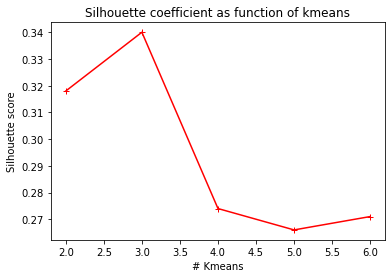

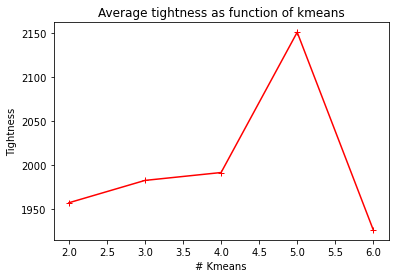

In [20]:
plt.plot(np.arange(2,7), list_silhouette, "+-", color = "red")
plt.xlabel("# Kmeans")
plt.ylabel("Silhouette score")
plt.title("Silhouette coefficient as function of kmeans")
plt.show()

plt.plot(np.arange(2,7), tightness, "+-", color = "red")
plt.xlabel("# Kmeans")
plt.ylabel("Tightness")
plt.title("Average tightness as function of kmeans")
plt.show()

In [21]:
%%time
kmeans = KMeans(n_clusters = 3).fit(X_scaled)
labels = kmeans.labels_
centroids = []
for clust in set(labels):
    lines = np.where(labels == clust)[0]
    centroids.append(df_X.iloc[lines].mean().to_numpy())

details_cluster(labels)

Cluster 1: 73.72%
Cluster 2: 20.45%
Cluster 3: 5.83%
Wall time: 214 ms


In [22]:
pd.DataFrame(centroids, columns=df_X.columns)

,price,freight_proportion_price,payment_installments,weight,quantity,delay,days_since_last_command,boleto,credit_card,voucher_debit_card
0,97.776857,0.295279,3.245552,1909.946490,1.117599,12.226653,236.887080,0.0,0.999943,0.000057
1,87.203025,0.337315,1.000000,1864.117388,1.127415,13.128638,248.814625,1.0,0.000000,0.000000
2,92.570686,0.338447,1.238565,1900.860206,1.101201,11.669811,232.524871,0.0,0.184631,0.815369


## Visualisation

In [23]:
pca = decomposition.PCA(n_components=10)
pca.fit(X_scaled)

PCA(n_components=10)

In [24]:
X_projected = pca.transform(X_scaled)
#dimension used for colorization
color = labels
#create data frame and add color vector
proj_data = np.concatenate((X_projected, np.reshape(color, [-1, 1])), axis=1)
proj_data = pd.DataFrame(proj_data)
columns_index = proj_data.shape[1] - 1
proj_data = proj_data.rename(columns = {columns_index : "color"})
fig = px.scatter_3d(proj_data, x=0, y=1, z=2, color="color", opacity=0.3,  size_max=0.5)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

# DBSCAN

Pour avoir des pistes d'études, un clustering non supervisé est réalisé.

## Recherche des meilleurs paramètres

In [25]:
%%time
std_scale = preprocessing.StandardScaler().fit(df_X)
X_scaled = std_scale.transform(df_X)
best_db, best_parameters, matrix_details = optimal_DBSCAN(X_scaled, min_samples = [20, 25, 30, 35],  epsilons = [1.5, 2.0, 2.5, 2.7])

20
25
30
35
Noise 1.10 %
Number of clusters 2
Silhouette 0.305
Wall time: 2min 50s


In [26]:
details_cluster(best_db.labels_)

Cluster 1: 78.68%
Cluster 2: 20.18%
Bruit: 1.14%


In [27]:
best_parameters

{'min_samples': 35, 'epsilon': 2.5}

## Choix des paramètres

In [28]:
matrix_details['silouette']

array([[0.24690786, 0.18738271, 0.30288883, 0.30069791],
       [0.24587247, 0.18508474, 0.30272108, 0.30217058],
       [0.24765798, 0.18278714, 0.30365515, 0.30217389],
       [0.24884642, 0.19892478, 0.30452664, 0.30230129]])

In [29]:
matrix_details['noise']

array([[0.042, 0.018, 0.008, 0.006],
       [0.046, 0.021, 0.009, 0.007],
       [0.051, 0.024, 0.01 , 0.007],
       [0.053, 0.027, 0.011, 0.007]])

In [30]:
matrix_details['nb_clusters']

array([[7., 8., 2., 2.],
       [7., 7., 2., 2.],
       [6., 7., 2., 2.],
       [6., 6., 2., 2.]])

### Centroid's coordinates

In [31]:
matrix_centroids = give_centroid(best_db.labels_, df_X)
#scale centroid and projet to PCA
centroid_scaled = std_scale.transform(matrix_centroids)
centroid_projected = pca.transform(centroid_scaled)
details_cluster(best_db.labels_)
pd.DataFrame(matrix_centroids, columns= df_X.columns)


cluster 0: 14745 elements
tightness = 1969.16

cluster 1: 4089 elements
tightness = 1993.53

cluster 2: 1166 elements
tightness = 1984.68
AVERAGE TIGHTNESS 1982.46
Cluster 1: 78.68%
Cluster 2: 20.18%
Bruit: 1.14%


,price,freight_proportion_price,payment_installments,weight,quantity,delay,days_since_last_command,boleto,credit_card,voucher_debit_card
0,97.776857,0.295279,3.245552,1909.946490,1.117599,12.226653,236.887080,0.0,0.999943,0.000057
1,87.203025,0.337315,1.000000,1864.117388,1.127415,13.128638,248.814625,1.0,0.000000,0.000000
2,92.570686,0.338447,1.238565,1900.860206,1.101201,11.669811,232.524871,0.0,0.184631,0.815369


## Visualisation des clusters trouvés avec DBSCAN

In [32]:
#dimension used for colorization
color = labels
#create data frame and add color vector
proj_data = np.concatenate((X_projected, np.reshape(color, [-1, 1])), axis=1)
proj_data = pd.DataFrame(proj_data)
columns_index = proj_data.shape[1] - 1
proj_data = proj_data.rename(columns = {columns_index : "color"})
#remove noise
indice = proj_data["color"] == -1
fig = px.scatter_3d(proj_data[~indice], x=0, y=1, z=2, color="color", opacity=0.2,  size_max=0.5)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))

# Segmentation RFM

In [33]:
def matrix_RFM(dt, end, beg = 0, silent = False):
    """
    Compute RFM matrix 
    Arguments:
        _beg: number of day since the lastest command
        _end: number of day since the lastest command
        _silent: flag to not display date
    Return RFM matrix
    """
    sub_dt = dt.loc[(dt["days_since_last_command"] >= beg) & (dt["days_since_last_command"] < end)]
    if silent is not True:
        range_time(dt, beg, end)
    recence = sub_dt[["customer_unique_id", 'days_since_last_command']].groupby(by = "customer_unique_id").min()
    recence = recence['days_since_last_command'].to_numpy() 
    #recence_absolue first day is 0
    recence_absolue = recence - np.min(recence)
    montant_moy = sub_dt[["customer_unique_id", 'payment_value']].groupby(by = "customer_unique_id").sum()
    montants = montant_moy['payment_value'].to_numpy()
    freq = sub_dt[["customer_unique_id", 'payment_value']].groupby(by = "customer_unique_id").count()
    freq = freq.to_numpy()
    RFM = np.zeros((len(freq), 4))
    RFM[:,0] = recence_absolue
    RFM[:,1] = recence
    RFM[:,2] = montants
    RFM[:,3] = np.ravel(freq)
    return pd.DataFrame({
    'Recence absolue': RFM[:, 0],
    'Recence': RFM[:, 1],
    'Montant cumulé': RFM[:, 2],
    'Nombre de connexion' : RFM[:, 3]
    })

In [34]:
def range_time(dt, beg, end):
    sub_dt = dt.loc[(dt["days_since_last_command"] >= beg) & (dt["days_since_last_command"] < end)]
    print("Prédiode analysée:")
    print("{0} - {1}".format(
        sub_dt["order_purchase_timestamp"].min(),
        sub_dt["order_purchase_timestamp"].max()
    ))

In [35]:
def clustering_Kmeans(dataframe, labels):
    centroids_kmeans = []
    standard_deviation = []
    for clust in set(labels):
        lines = np.where(labels == clust)[0]
        centroids_kmeans.append(dataframe.iloc[lines].mean().to_numpy())
        standard_deviation.append(dataframe.iloc[lines].std().to_numpy())
    print(details_cluster(kmeans.labels_))
    return pd.DataFrame(centroids_kmeans, columns=dataframe.columns), pd.DataFrame(standard_deviation, columns=dataframe.columns)

In [36]:
def RFM_plot(x, y, labels, path = None, title ="",
             colormap = np.array(['r', 'g', 'b', 
            'y', 'orange', 'cyan', 'black'])):
    """
    Visualize clustering results on RFM plot
    Arguments:
        _x: abscice's values (list)
        _y: ordinate's values (list)
        _labels: points's assignment (list)
        _path: localization to save figure
        _title: figure's title
        _colormap: list of color use for each clusters
    """
    cpt = 0
    for i in set(labels):
        indices = np.where(labels == i)[0]
        plt.scatter(x[indices], y[indices], alpha = 0.1, 
                    c= colormap[cpt], label = "cluster "+str(cpt+1))
        cpt += 1
    plt.title(title, size = 18)
    plt.ylabel("Montant cumulé")
    plt.xlabel("Recence (jour)")
    plt.ylim(0,715)
    plt.legend()
    if path is not None:
        plt.savefig(path)
    plt.show()

## Ensembles des achats

In [37]:
%%time
RFM_all = matrix_RFM(df, 600, 0)[["Recence absolue", "Montant cumulé", "Nombre de connexion"]]
#Normalize RMF matrix
std_scale = preprocessing.StandardScaler().fit(RFM_all)
RFM_all_scaled = std_scale.transform(RFM_all)

Prédiode analysée:
2017-01-07 20:45:31 - 2018-08-29 15:00:37
Wall time: 317 ms


(<Figure size 432x288 with 2 Axes>,
 <AxesSubplot:>,
 {'mappable': <matplotlib.contour.QuadContourSet at 0x2692415a7f0>,
  'cbar': <matplotlib.colorbar.Colorbar at 0x269238404c0>})

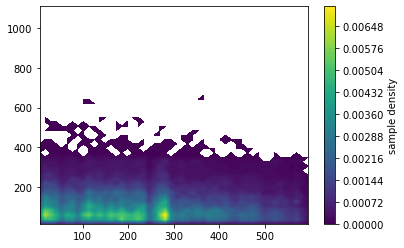

In [38]:
xall = RFM_all['Recence absolue'].to_numpy()
yall = RFM_all['Montant cumulé'].to_numpy()
pyemma.plots.plot_density(xall, yall, nbins = 50)

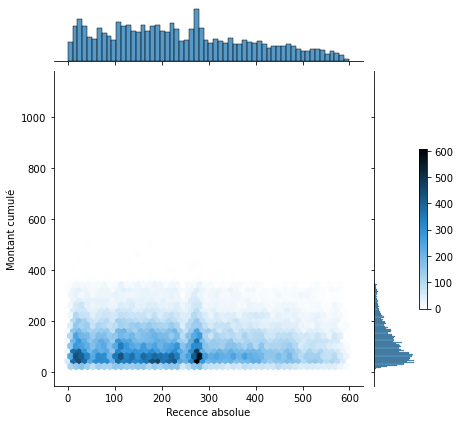

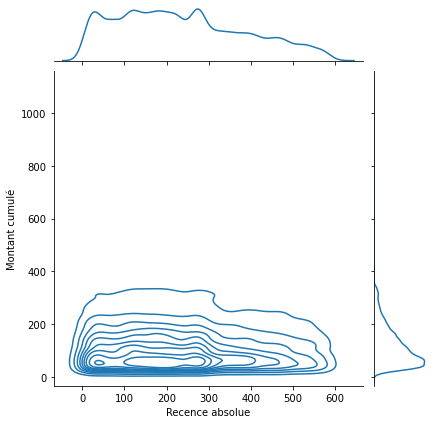

In [39]:
sns.jointplot(x=RFM_all['Recence absolue'], y=RFM_all["Montant cumulé"], kind="hex")
#plt.clim(0, 550)
plt.colorbar()
plt.show()
sns.jointplot(x=RFM_all['Recence absolue'], y=RFM_all["Montant cumulé"], kind="kde")
plt.show()

In [40]:
#Normalize data improve clustering quality
kmeans = KMeans(n_clusters = 3).fit(RFM_all_scaled)
labels = kmeans.labels_
centroid_moy, centroid_std = clustering_Kmeans(RFM_all, labels)
centroid_moy

Cluster 1: 55.89%
Cluster 2: 41.19%
Cluster 3: 2.92%
None


,Recence absolue,Montant cumulé,Nombre de connexion
0,128.062128,114.997969,1.000000
1,384.668061,111.134997,1.000000
2,219.067066,231.737341,2.105788


In [41]:
centroid_std

,Recence absolue,Montant cumulé,Nombre de connexion
0,72.286627,72.444771,0.0000
1,92.973041,71.091882,0.0000
2,141.543134,131.426364,0.4899


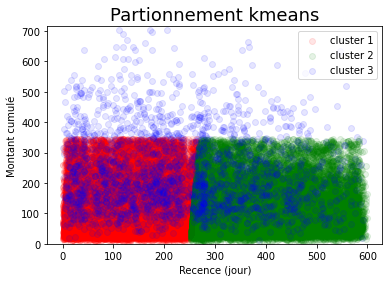

In [42]:
x = RFM_all['Recence absolue'].to_numpy()
y = RFM_all['Montant cumulé'].to_numpy()
RFM_plot(x, y, labels, title = "Partionnement kmeans")

In [43]:
RFM_all.describe()

,Recence absolue,Montant cumulé,Nombre de connexion
count,85902.000000,85902.000000,85902.000000
mean,236.411818,116.811065,1.032246
std,150.629523,76.934571,0.203995
min,0.000000,1.856818,1.000000
25%,114.000000,58.110000,1.000000
50%,218.000000,97.710000,1.000000
75%,345.000000,157.790000,1.000000
max,599.000000,1122.720000,15.000000


Les 3 premiers quartiles peuvent être découpé par tranche de 110 jours (soit environ 1 quadrimestre).

Le montant cumulé peut être catégorisé en 4 parites:
*    inf 60 euros: faible montant
*    sup 60 et inf 100: montant mediant
*    sup 100 et inf 150: haut montant
*    sup 150: très haut montant

# Stabilité des modèles de clustering en fonction du temps



In [44]:
def compute_RI_kmeans(df, kmeans_mdl1, days, start = [0], k = 3):
    """
    Compute rand indice. By default, the starting point is set to 0
    days give the last value used for each iteration.
    It's possible to set custom sliding window for each step by 
    customizing days and start.
    Example:
        compute_RI_kmeans(df, kmeans_mdl1, days=[30, 90], start = [0,60])
    Arguments:
        _df: dataframe
        _kmeans_mdl1: scikit leanr Kmean objet
        _days: last day (use to made RFM matrix)
        _start: first day
        _k: number of kmeans
    """
    RI = []
    if len(start) == 1:
        start = np.reshape([start] * len(days), -1)
    for beg, end in zip(start, days):
        #new dataset
        RFM_mdl2 = matrix_RFM(df, end, beg, silent = True)[["Recence absolue", 
                                                              "Montant cumulé", 
                                                              "Nombre de connexion"]]
        RFM_mdl2_scaled = std_scale.transform(RFM_mdl2)
        #kmeans found with first model
        kmeans_mdl1_label = kmeans_mdl1.predict(RFM_mdl2_scaled)
        #new model of kmeans fit on new dataset
        kmeans_mdl2 = KMeans(n_clusters = k).fit(RFM_mdl2_scaled)
        tmp = metrics.rand_score(kmeans_mdl1_label, kmeans_mdl2.labels_)
        RI.append(round(tmp,3))
    return np.array(RI)

## Fenêtre grandissante

Les modèles de clustering créés sont robustes à l'ajout de nouveaux clients ?
 * Ajout de nouvelles commandes par tranche de mois
 * Ajout de nouvelles commandes par tranche de 3 mois (quadrimestre)

### Données par mois

Prédiode analysée:
2018-07-31 12:40:23 - 2018-08-29 15:00:37


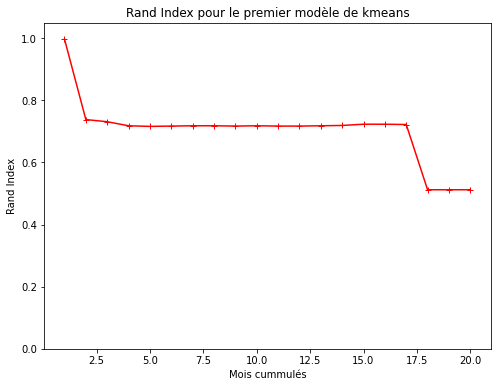

In [45]:
#initial model (30 days)
RFM_mdl1 = matrix_RFM(df, 30, 0)[["Recence absolue", "Montant cumulé", "Nombre de connexion"]]
RFM_mdl1_scaled = std_scale.transform(RFM_mdl1)
kmeans_mdl1 = KMeans(n_clusters = 3).fit(RFM_mdl1_scaled)
#Randex indices
days = np.arange(30,630, 30)
RI = compute_RI_kmeans(df, kmeans_mdl1, days)
#Graphic representation
plt.figure(figsize=(8,6))
plt.plot(days/30, RI, "+-", color = "red")
plt.xlabel("Mois cummulés")
plt.ylabel("Rand Index")
plt.title("Rand Index pour le premier modèle de kmeans")
plt.ylim(0,1.05)
plt.show()

A partir de **2 mois de commande cummulé**, l'indice de Rand varit faiblement. Un décrochage est oberservé à partir du **mois 18**.
Les mois d'après sont identiques en terme d'indice. Les acheteurs, au 18ième mois, ont eu un comportement très différent.

### Données par quadrimestre

Prédiode analysée:
2018-05-02 12:34:58 - 2018-08-29 15:00:37


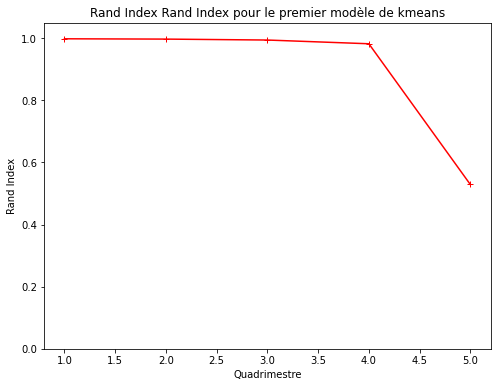

In [46]:
#initial model (120 days)
RFM_mdl1 = matrix_RFM(df, 120, 0)[["Recence absolue", "Montant cumulé", "Nombre de connexion"]]
RFM_mdl1_scaled = std_scale.transform(RFM_mdl1)
kmeans_mdl1 = KMeans(n_clusters = 3).fit(RFM_mdl1_scaled)
#Randex indices
days = np.arange(120,720, 120)
RI = compute_RI_kmeans(df, kmeans_mdl1, days)
#Graphic representation
plt.figure(figsize=(8,6))
plt.plot(days/120, RI, "+-", color = "red")
plt.xlabel("Quadrimestre")
plt.ylabel("Rand Index")
plt.title("Rand Index Rand Index pour le premier modèle de kmeans")
plt.ylim(0,1.05)
plt.show()

## Fenêtre fixe coulissante

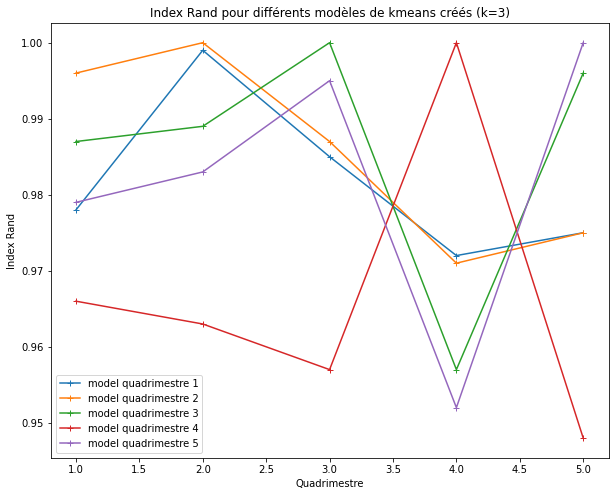

In [47]:
#initial model (120 days)
start = [0, 120, 240, 360, 480]
end = [120, 240, 360, 480, 600]
cpt = 1
plt.figure(figsize=(10,8))
for beg, last in zip(start, end):
    #reference clustering model
    RFM_mdl1 = matrix_RFM(df, last, beg, silent = True)[["Recence absolue", "Montant cumulé", "Nombre de connexion"]]
    RFM_mdl1_scaled = std_scale.transform(RFM_mdl1)
    kmeans_mdl1 = KMeans(n_clusters = 3, random_state = 42).fit(RFM_mdl1_scaled)
    #Randex indices
    day0 = np.arange(0,600, 120)
    day1 = np.arange(120,720, 120)
    #evaluate for different timestep
    RI = compute_RI_kmeans(df, kmeans_mdl1, days=day1, start=day0)
    #Graphic representation
    plt.plot(days/120, RI, "+-", label="model quadrimestre "+str(cpt))
    plt.xlabel("Quadrimestre")
    plt.ylabel("Index Rand")
    plt.title("Index Rand pour différents modèles de kmeans créés (k=3)")
    plt.legend()
    cpt += 1
    #plt.ylim(0,1.05)
plt.show()

En prenant un quadrimestre, les modèles de clustering ont la même valeur d'indice Rand.

# 1er quadrimestre

In [48]:
RFM_raw = matrix_RFM(df, 120, 0)[["Recence absolue", "Montant cumulé", "Nombre de connexion"]]
RFM_raw.describe()

Prédiode analysée:
2018-05-02 12:34:58 - 2018-08-29 15:00:37


,Recence absolue,Montant cumulé,Nombre de connexion
count,22709.000000,22709.000000,22709.000000
mean,60.357259,115.763129,1.012902
std,35.041940,73.464415,0.121862
min,0.000000,4.242500,1.000000
25%,28.000000,58.220000,1.000000
50%,59.000000,98.340000,1.000000
75%,91.000000,157.240000,1.000000
max,119.000000,701.430000,7.000000


La grosse majorité des clients ont effectué un seul achat

## Plot de densité

(<Figure size 432x288 with 2 Axes>,
 <AxesSubplot:>,
 {'mappable': <matplotlib.contour.QuadContourSet at 0x269551db1f0>,
  'cbar': <matplotlib.colorbar.Colorbar at 0x269255fce20>})

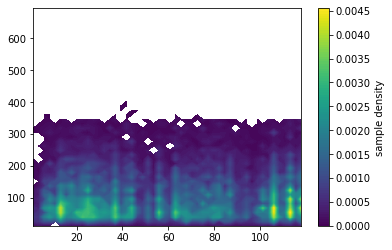

In [49]:
import pyemma
xall = RFM_raw['Recence absolue'].to_numpy()
yall = RFM_raw['Montant cumulé'].to_numpy()
pyemma.plots.plot_density(xall, yall, nbins = 50)

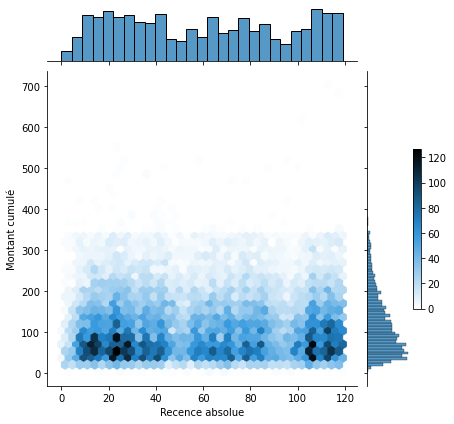

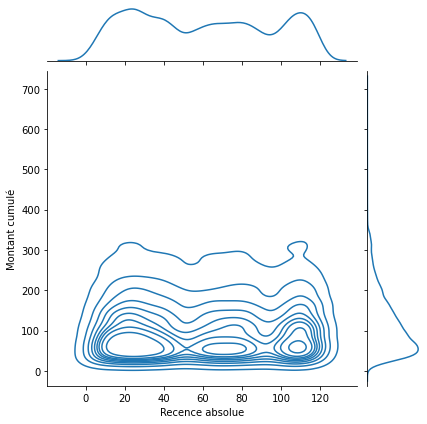

In [50]:
sns.jointplot(x=RFM_raw['Recence absolue'], y=RFM_raw["Montant cumulé"], kind="hex")
#plt.clim(0, 550)
plt.colorbar()
plt.show()
sns.jointplot(x=RFM_raw['Recence absolue'], y=RFM_raw["Montant cumulé"], kind="kde")
plt.show()

## Kmeans

In [51]:
#Normalize data improve clustering quality
RFM_raw_scaled = std_scale.transform(RFM_raw)

kmeans = KMeans(n_clusters = 3).fit(RFM_raw_scaled)
labels = kmeans.labels_
centroid_moy, centroid_std = clustering_Kmeans(RFM_raw, labels)
centroid_moy

Cluster 1: 68.87%
Cluster 2: 29.90%
Cluster 3: 1.23%
None


,Recence absolue,Montant cumulé,Nombre de connexion
0,60.219118,75.211411,1.000000
1,61.146834,204.478011,1.000000
2,48.885305,229.938124,2.050179


In [52]:
centroid_std

,Recence absolue,Montant cumulé,Nombre de connexion
0,35.269831,32.954086,0.000000
1,34.588558,52.223036,0.000000
2,30.950548,123.805309,0.346085


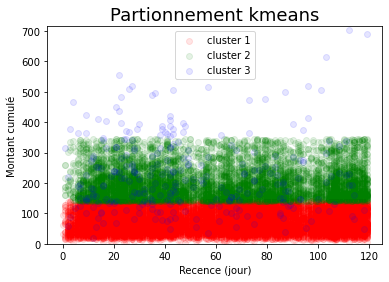

In [53]:
x = RFM_raw['Recence absolue'].to_numpy()
y = RFM_raw['Montant cumulé'].to_numpy()
RFM_plot(x, y, labels, title = "Partionnement kmeans")

Il y a trois catégories de clients:
 * Clients dont le montant moyant correspond à panier médiant (70 %)
 * Clients dont le montant est très haut (28.0 %)
 * Clients régulier dont le montant est très haut (2.0 %)

## DBSCAN

### Paramètres

In [54]:
%%time
RFM_scaled = std_scale.transform(RFM_raw)
#Looking for best parameters
best_db, best_parameters, matrix_details = optimal_DBSCAN(RFM_scaled, min_samples = [5, 10, 30, 40], epsilons = [0.5, 1, 1.5])

5
10
30
40
Noise 0.00 %
Number of clusters 3
Silhouette 0.794
Wall time: 2min 19s


In [55]:
matrix_details

{'noise': array([[0.001, 0.   , 0.   ],
        [0.001, 0.   , 0.   ],
        [0.002, 0.001, 0.001],
        [0.003, 0.001, 0.001]]),
 'nb_clusters': array([[2., 2., 3.],
        [3., 2., 2.],
        [2., 2., 2.],
        [2., 2., 2.]]),
 'silouette': array([[0.79311607, 0.79343822, 0.79373775],
        [0.78815384, 0.79343822, 0.79343822],
        [0.78906383, 0.79202978, 0.79311607],
        [0.78642882, 0.79102749, 0.79311607]])}

In [56]:
best_db

DBSCAN(eps=1.5, n_jobs=-1)

In [57]:
results = DBSCAN_results(best_db.labels_, RFM_scaled)
print("Noise {0:.2f} %".format(results['noise']*100))
print("Silhouette {0:.3f}".format(results['silhouette']))
details_cluster(best_db.labels_)

Noise 0.00 %
Silhouette 0.794
Cluster 1: 98.77%
Cluster 2: 1.18%
Cluster 3: 0.02%
Bruit: 0.02%


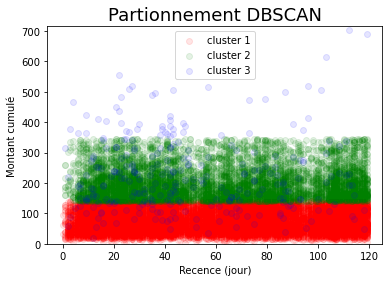

In [58]:
x = RFM_raw['Recence absolue'].to_numpy()
y = RFM_raw['Montant cumulé'].to_numpy()
RFM_plot(x, y, labels, title = "Partionnement DBSCAN")
#Noise in yellow

En minimisant le bruit, le partionnement n'est pas assez fin.
Les zone de densités ne sont pas délimité clairement.

In [59]:
#Centroid des clusters
#matrix_centroids = give_centroid(best_db.labels_, RFM_raw)
labels = best_db.labels_
centroids = []
for clust in set(labels):
    if clust == -1:
        continue
    lines = np.where(labels == clust)[0]
    centroids.append(RFM_raw.iloc[lines].mean().to_numpy())
    print("cluster {0}: {1} elements".format(clust, len(lines)))

pd.DataFrame(centroids, columns=RFM_raw.columns)

cluster 0: 22430 elements
cluster 1: 269 elements
cluster 2: 5 elements


,Recence absolue,Montant cumulé,Nombre de connexion
0,60.499955,114.342941,1.0
1,48.695167,227.068017,2.0
2,42.000000,161.698000,3.0


# quadrimestre 2

In [60]:
RFM_raw = matrix_RFM(df, 240, 120)[["Recence absolue", "Montant cumulé", "Nombre de connexion"]]
RFM_raw.describe()

Prédiode analysée:
2018-01-02 12:31:51 - 2018-05-02 12:29:10


,Recence absolue,Montant cumulé,Nombre de connexion
count,25058.000000,25058.000000,25058.000000
mean,59.825724,116.169071,1.019954
std,34.716449,75.696676,0.150032
min,0.000000,4.375000,1.000000
25%,30.000000,57.380000,1.000000
50%,60.500000,97.780000,1.000000
75%,90.000000,159.707500,1.000000
max,119.000000,704.150000,5.000000


La grosse majorité des clients ont effectué un seul achat

## Plot de densité

(<Figure size 432x288 with 2 Axes>,
 <AxesSubplot:>,
 {'mappable': <matplotlib.contour.QuadContourSet at 0x269238dd670>,
  'cbar': <matplotlib.colorbar.Colorbar at 0x26923a59100>})

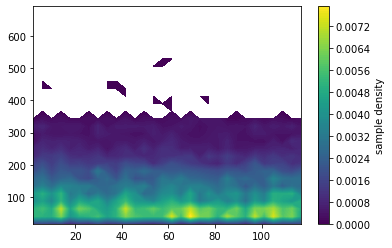

In [61]:
import pyemma
xall = RFM_raw['Recence absolue'].to_numpy()
yall = RFM_raw['Montant cumulé'].to_numpy()
pyemma.plots.plot_density(xall, yall, nbins = 30)

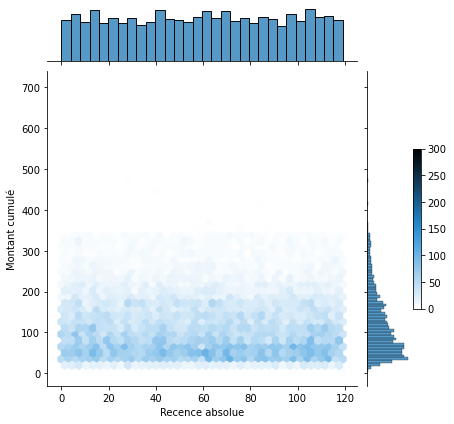

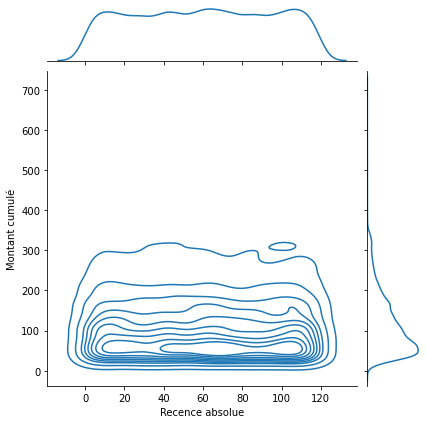

In [62]:
sns.jointplot(x=RFM_raw['Recence absolue'], y=RFM_raw["Montant cumulé"], kind="hex")
plt.clim(0, 300)
plt.colorbar()
plt.show()
sns.jointplot(x=RFM_raw['Recence absolue'], y=RFM_raw["Montant cumulé"], kind="kde")
plt.show()

## Kmeans

In [63]:
RFM_raw_scaled = std_scale.transform(RFM_raw)
kmeans = KMeans(n_clusters = 3).fit(RFM_raw_scaled)
labels = kmeans.labels_
centroid_moy, centroid_std = clustering_Kmeans(RFM_raw, labels)
centroid_moy

Cluster 1: 29.68%
Cluster 2: 68.44%
Cluster 3: 1.88%
None


,Recence absolue,Montant cumulé,Nombre de connexion
0,59.256152,205.822370,1.000000
1,60.155160,74.138409,1.000000
2,56.823779,230.976444,2.061571


In [64]:
centroid_std

,Recence absolue,Montant cumulé,Nombre de connexion
0,34.891839,53.085192,0.000000
1,34.727910,32.876110,0.000000
2,31.145451,128.862924,0.303225


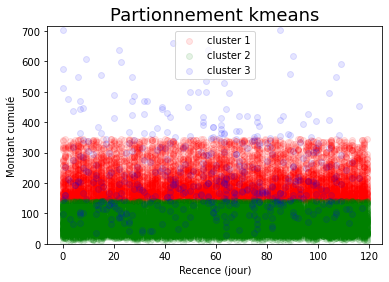

In [65]:
x = RFM_raw['Recence absolue'].to_numpy()
y = RFM_raw['Montant cumulé'].to_numpy()
RFM_plot(x, y, labels, title = "Partionnement kmeans")

Il y a trois catégories de clients:
 * Clients dont le montant moyen correspond à panier médiant (68.4 %)
 * Clients dont le montant est très haut (29.7 %)
 * Clients régulier dont le montant est très haut (1.9 %)

# quadrimestre 3

In [66]:
RFM_raw = matrix_RFM(df, 360, 240)[["Recence absolue", "Montant cumulé", "Nombre de connexion"]]
RFM_raw.describe()

Prédiode analysée:
2017-09-04 12:43:57 - 2018-01-02 12:31:13


,Recence absolue,Montant cumulé,Nombre de connexion
count,19104.000000,19104.000000,19104.000000
mean,54.590766,116.103396,1.020467
std,32.381902,75.094716,0.154670
min,0.000000,1.856818,1.000000
25%,30.000000,59.170000,1.000000
50%,46.000000,96.875000,1.000000
75%,82.000000,156.297500,1.000000
max,119.000000,635.950000,5.000000


La grosse majorité des clients ont effectué un seul achat

## Plot de densité

(<Figure size 432x288 with 2 Axes>,
 <AxesSubplot:>,
 {'mappable': <matplotlib.contour.QuadContourSet at 0x2692404a0a0>,
  'cbar': <matplotlib.colorbar.Colorbar at 0x26923a14820>})

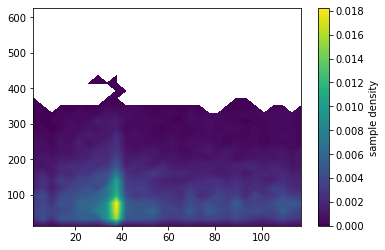

In [67]:
import pyemma
xall = RFM_raw['Recence absolue'].to_numpy()
yall = RFM_raw['Montant cumulé'].to_numpy()
pyemma.plots.plot_density(xall, yall, nbins = 30)

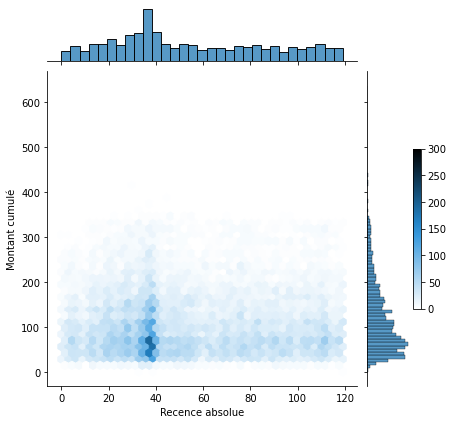

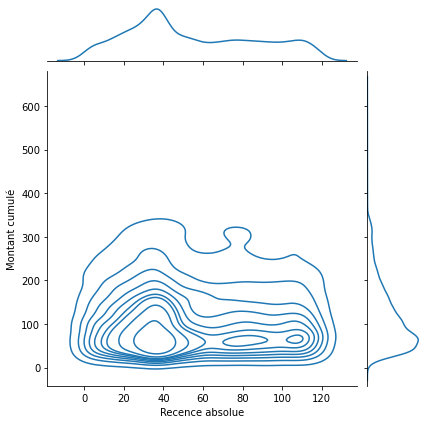

In [68]:
sns.jointplot(x=RFM_raw['Recence absolue'], y=RFM_raw["Montant cumulé"], kind="hex")
plt.clim(0, 300)
plt.colorbar()
plt.show()
sns.jointplot(x=RFM_raw['Recence absolue'], y=RFM_raw["Montant cumulé"], kind="kde")
plt.show()

## Kmeans

In [69]:
RFM_raw_scaled = std_scale.transform(RFM_raw)
kmeans = KMeans(n_clusters = 3).fit(RFM_raw_scaled)
labels = kmeans.labels_
centroid_moy, centroid_std = clustering_Kmeans(RFM_raw, labels)
centroid_moy

Cluster 1: 69.89%
Cluster 2: 28.21%
Cluster 3: 1.91%
None


,Recence absolue,Montant cumulé,Nombre de connexion
0,54.697251,75.732061,1.000000
1,54.526072,208.781004,1.000000
2,51.642857,224.779375,2.074176


In [70]:
centroid_std

,Recence absolue,Montant cumulé,Nombre de connexion
0,32.551677,32.863561,0.000000
1,32.101788,53.452468,0.000000
2,30.130459,123.843616,0.352079


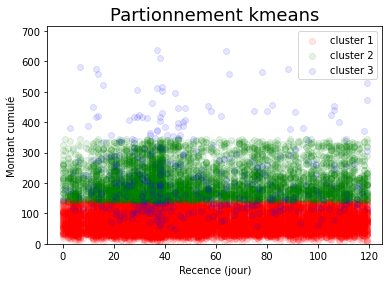

In [71]:
x = RFM_raw['Recence absolue'].to_numpy()
y = RFM_raw['Montant cumulé'].to_numpy()
RFM_plot(x, y, labels, title = "Partionnement kmeans")

Il y a trois catégories de clients:
 * Clients dont le montant moyen correspond à panier médiant (69.9 %)
 * Clients dont le montant est très haut (28.2 %)
 * Clients régulier dont le montant est très haut (1.9 %)

# Année précédente

In [72]:
RFM_raw = matrix_RFM(df, 600, 360)[["Recence absolue", "Montant cumulé", "Nombre de connexion"]]
RFM_raw.describe()

Prédiode analysée:
2017-01-07 20:45:31 - 2017-09-04 12:25:40


,Recence absolue,Montant cumulé,Nombre de connexion
count,20088.000000,20088.000000,20088.000000
mean,95.982427,113.323145,1.026334
std,63.017746,74.521275,0.172984
min,0.000000,1.737500,1.000000
25%,41.000000,56.780000,1.000000
50%,90.000000,93.480000,1.000000
75%,146.000000,151.690000,1.000000
max,239.000000,746.280000,4.000000


La grosse majorité des clients ont effectué un seul achat

## Plot de densité

(<Figure size 432x288 with 2 Axes>,
 <AxesSubplot:>,
 {'mappable': <matplotlib.contour.QuadContourSet at 0x26977234d60>,
  'cbar': <matplotlib.colorbar.Colorbar at 0x269556bdfa0>})

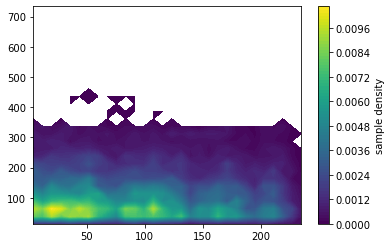

In [73]:
import pyemma
xall = RFM_raw['Recence absolue'].to_numpy()
yall = RFM_raw['Montant cumulé'].to_numpy()
pyemma.plots.plot_density(xall, yall, nbins = 30)

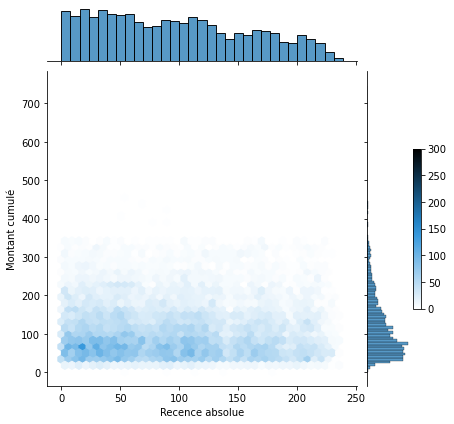

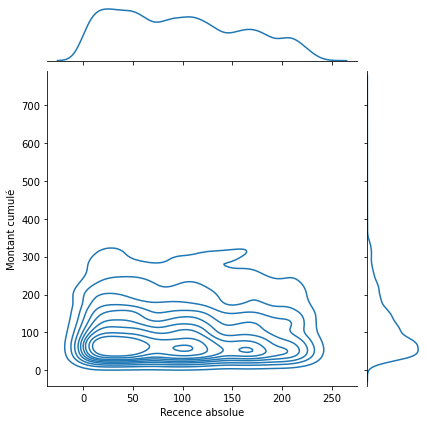

In [74]:
sns.jointplot(x=RFM_raw['Recence absolue'], y=RFM_raw["Montant cumulé"], kind="hex")
plt.clim(0, 300)
plt.colorbar()
plt.show()
sns.jointplot(x=RFM_raw['Recence absolue'], y=RFM_raw["Montant cumulé"], kind="kde")
plt.show()

## Kmeans

In [75]:
RFM_raw_scaled = std_scale.transform(RFM_raw)
kmeans = KMeans(n_clusters = 3).fit(RFM_raw_scaled)
labels = kmeans.labels_
centroid_moy, centroid_std = clustering_Kmeans(RFM_raw, labels)
centroid_moy

Cluster 1: 28.05%
Cluster 2: 69.51%
Cluster 3: 2.43%
None


,Recence absolue,Montant cumulé,Nombre de connexion
0,96.879681,204.317398,1.0000
1,96.107562,73.087564,1.0000
2,82.069530,213.726120,2.0818


In [76]:
centroid_std

,Recence absolue,Montant cumulé,Nombre de connexion
0,63.332972,52.959894,0.000000
1,62.963920,31.985475,0.000000
2,59.312690,122.064536,0.295901


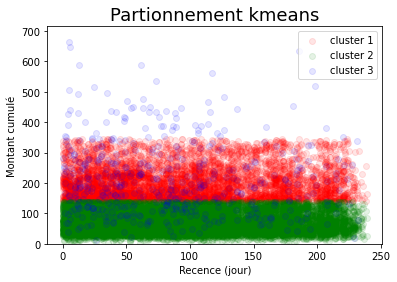

In [77]:
x = RFM_raw['Recence absolue'].to_numpy()
y = RFM_raw['Montant cumulé'].to_numpy()
RFM_plot(x, y, labels, title = "Partionnement kmeans")